
# 다양한 OCR 모델 비교하기
---

식단 다이어리 어플리케이션에 오늘 먹은 음식(제품)의 영양정보를 사진으로부터 읽어들이는 서비스를 추가하고자 한다.<br>
Google OCR API, keras-ocr, Tesseract 중 어느 모듈을 사용할지 기술검정을 해보자.

## STEP 0. 설계
---

1. 검증용 데이터셋 준비
    - 제품의 영양정보가 포함된 사진을 준비한다.
2. 검증용 데이터셋을 이용하여 Google OCR API, keras-ocr, Tesseract의 성능을 테스트를 진행한다.
    - 성능평가 기준
        - 영양정보를 읽어 들이는 서비스이므로 정보의 이름과 함유량을 찾아내는 것을 평가 기준으로 두며 다음의 세가지 지표를 계산하여 각 케이스를 비교한다.
        - detection rate
            - 정보의 이름과 함유량의 위치를 찾아낸 비율
            - (찾아낸 정보의 이름과 함유량의 수) / (찾아내야하는 정보의 이름과 함유량의 수)
            - 만약 Total Fat을 'Total', 'Fat' 두개로 찾아내더라고 이는 하나를 찾은 것이라고 간주한다.
        - recognition rate
            - 정보의 이름과 함유량을 읽어낸 비율
            - (읽어낸 정보의 이름과 함유량의 수) / (읽어내야하는 정보의 이름과 함유량의 수)
            - 이때, 읽어낸 정보의 이름 혹은 함유량이 실제 적혀있는 문자와 다르더라도-recognition이 제대로 이루어지지 않더라도- 그를 포함하여 계산을 진행한다.
        - recognition accuracy
            - 읽어낸 정보의 이름과 함유량 중 정확하게 읽어낸 비율,
            - (정확하게 읽어낸 이름과 함유량의 수)/(읽어낸 정보의 이름과 함유량의 수)
    - 읽어내야하는 정보 : 위에서 언급한 읽어들여야하는 정보는 다음과 같다.
        - 칼로리/Calories
        - 지방/Total Fat
        - 트랜스지방/Trans Fat
        - 포화지방/Sturated Fat
        - 콜레스테롤/Cholesterol
        - 나트륨/Sodium
        - 탄수화물/Total Carbohydate
        - 식이섬유/Dietary Fiber
        - 당류/Sugars
        - 단백질/Protein
    - 테스트는 각 이미지에 대하여 아래의 과정을 반복하는 것으로 진행한다.
        1. 대상 이미지에 각 모듈을 적용하여 OCR 결과를 확인해본다.
        2. 1의 결과를 이미지로 출력하여 detection 성공 여부를 확인하고 detection rate를 계산한다.
        3. 1의 결과로부터 recognition rate와 recognition accuracy를 계산한다.
3. 테스트 결과 분석
    - 테스트 과정에서 계산된 지표들을 이용하여 모듈들을 비교하고, 서비스에 적합한 모듈이 어떤것인지를 판별해 본다.

## STEP 1. 검증용 데이터셋 준비
---

- 영문으로 영양성분이 적힌 이미지 3개와 한글로 영양성분이 적힌 이미지 3개를 준비였다.

In [11]:
!ls ./Nutrition_Facts/imgs

01.jpg	02.jpg	03.jpeg  04.png  05.jpg  06.jpg


- 01\~03까지는 영문 데이터, 04\~06까지는 한글 데이터이다.

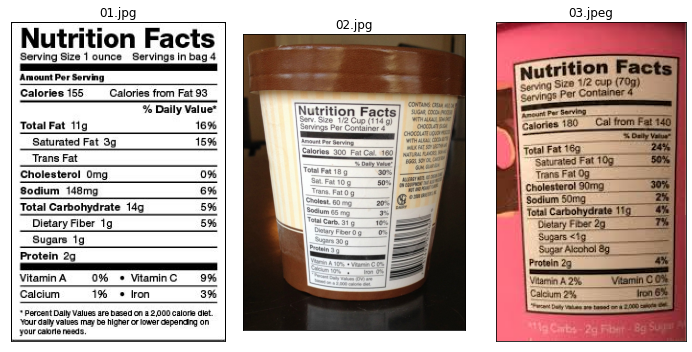

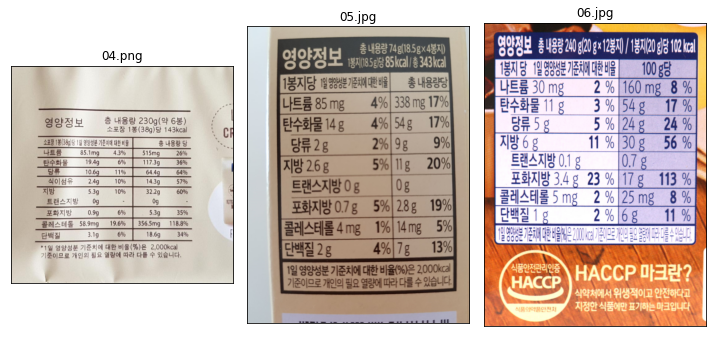

In [12]:
img_name_list = sorted(os.listdir(img_path))
img_path_list = [ img_path + '/' + file_name for file_name in img_name_list ]

show_images(img_path_list[:3], img_name_list[:3], (10, 5), 3)
show_images(img_path_list[3:], img_name_list[3:], (10, 5), 3)

## STEP 2. 모듈 테스트
---

In [88]:
reports = {
    'GOOGLE-OCR-API' : [],
    'KERAS-OCR': [],
    'TESSERACT':[]
}

module_names = ['GOOGLE-OCR-API', 'KERAS-OCR', 'TESSERACT']

### [T1] Nutrition Facts-ENG-1

#### 이미지 확인

In [89]:
figsize = (4, 6)
img_idx = 0

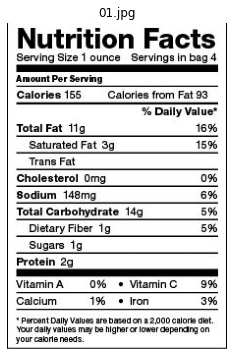

In [26]:
show_image(img_path_list[img_idx], img_name_list[img_idx], figsize)

#### 모듈 실행 후 결과 저장
- google ocr api

In [90]:
google_res = test_google(img_path_list[img_idx])
google_report = Report('GOOGLE-OCR-API', img_path_list[img_idx], 'eng')
google_report.summary(google_res)

- keras ocr

In [16]:
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /home/aiffel-dj1/.keras-ocr/craft_mlt_25k.h5
Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.
Looking for /home/aiffel-dj1/.keras-ocr/crnn_kurapan.h5


In [91]:
keras_res = test_keras_ocr(img_path_list[img_idx], pipeline)
keras_report = Report('KERAS-OCR', img_path_list[img_idx], 'eng')
keras_report.summary(keras_res)

- tesseract

In [92]:
tesseract_res = test_tesseract(img_path_list[img_idx], 'eng')
tesseract_report = Report('TESSERACT', img_path_list[img_idx], 'eng')
tesseract_report.summary(tesseract_res)

#### detection rate 계산
- 이번 데이터에서 찾아내야하는 영역은 총 19개(Calories,  155, Total Fat, 11g, Saturated Fat, 11g, Trans Fat, Cholesterol, 0mg, Sodium, 148mg, Total Carbohydrate, 14g, Dietary Fiber, 1g, Sugars, 1g, Protein, 2g)이다.
- bounding box 출력

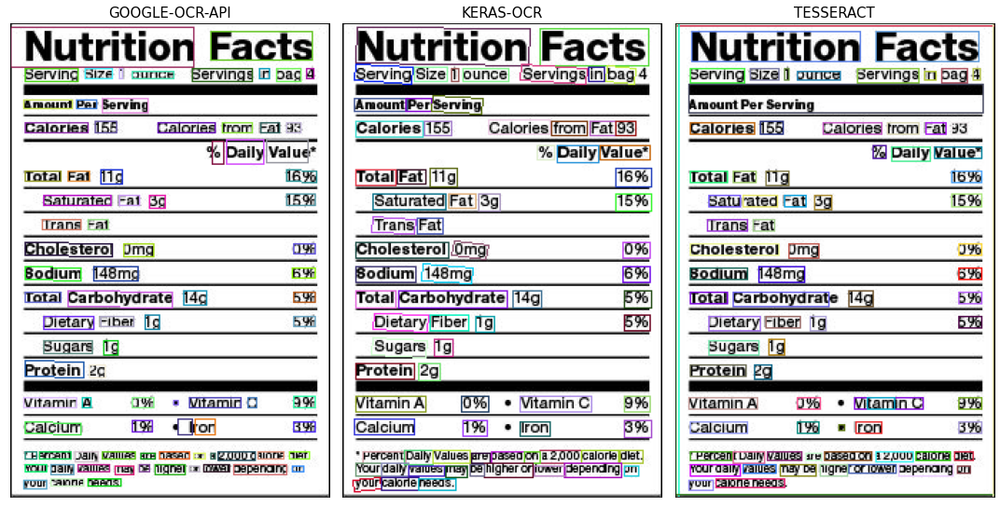

In [29]:
fig, axes = plt.subplots(1, 3, figsize=(15, 8))
bounds_imgs = [google_report.get_img_with_bounds(),
               keras_report.get_img_with_bounds(),
               tesseract_report.get_img_with_bounds()]

for i, ax in enumerate(axes):
    ax.imshow(cv2.cvtColor(bounds_imgs[i], cv2.COLOR_BGR2RGB))
    ax.set_title(module_names[i], fontsize=15)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.tight_layout()
plt.show()

- detection rate 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾은 정보 | Calories,  155, Total Fat, 11g, Saturated Fat, 11g, Trans Fat, Cholesterol, 0mg, Sodium, 148mg, Total Carbohydrate, 14g, Dietary Fiber, 1g, Sugars, 1g, Protein, 2g | Calories,  155, Total Fat, 11g, Saturated Fat, 11g, Trans Fat, Cholesterol, 0mg, Sodium, 148mg, Total Carbohydrate, 14g, Dietary Fiber, 1g, Sugars, 1g, Protein, 2g | Calories,  155, Total Fat, 11g, Saturated Fat, 11g, Trans Fat, Cholesterol, 0mg, Sodium, 148mg, 14g, Dietary Fiber, 1g, Sugars, 1g, Protein, 2g | 
| 찾은 정보의 개수 | 19 | 19 | 18 |
| detection rate | 1 | 1 | 18/19 ≓ 0.947368421 |

In [93]:
google_report.set_detection_rate(1)
keras_report.set_detection_rate(1)
tesseract_report.set_detection_rate(18/19)

#### recognition rate/racognition accuracy 계산
- 각 Report에서 recognition 결과 저장

In [27]:
google_report.get_recognition_results((5, 35), save=True, show=False)
keras_report.get_recognition_results((5, 35), save=True, show=False)
tesseract_report.get_recognition_results((5, 35), save=True, show=False)

save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/google_ocr_api/01.png
save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/keras_ocr/01.png
save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/tesseract/01.png


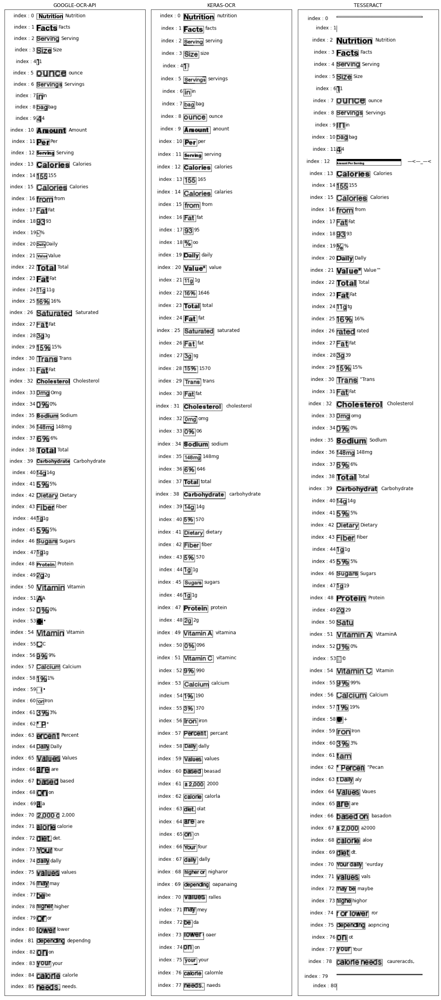

In [31]:
show_images([google_result_path + '/01.png',
             keras_result_path + '/01.png',
             tesseract_result_path + '/01.png'],
            module_names, figsize=(15, 35), col_num=3)

- recognition rate 계산 

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾아낸 관심 영역의 인덱스 | 13, 14, 22-23, 24, 26-27, 28, 30-31, 32, 33, 35, 36, 38-39, 40, 42-43, 44, 46, 47, 48, 49  | 12, 13, 23-24, 21, 25-26, 27, 29-30, 31, 32, 34. 35, 37-38, 39, 41-42, 44, 45, 46, 47, 48 | 13, 14, 22-23, 24, [50, 26, 27], 28, 30-31, 32, 33, 35, 36, 40, 42-43, 44, 46, 47, 48, 49 |
| 관심 영역에서 recognition이 성공한 횟수 | 19 | 19 | 18 |
| recognition rate | 1 | 1 | 1 |

In [94]:
google_report.set_recognition_rate(1)
keras_report.set_recognition_rate(1)
tesseract_report.set_recognition_rate(1)

- recognition accuracy - 1) 기댓값(라벨)과 recognition 결과값

|  기댓값  | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| Calories | Calories | Calories | Calories |
| 155 |  155 | 155 | 155 |
| Total Fat | Total Fat | otal Fat | Total Fat |
| 11g | 11g | 1g | tg |
| Saturated Fat | Saturated Fat | Saturated Fat | rated Fat  |
| 3g | 3g | sg | 39 |
| Trans Fat | Trans Fat  | Trans Fat | "Trans Fat  |
| Cholesterol |  Cholesterol | Cholesterol | Cholesterol |
| 0mg | 0mg  | 0mg | omg |
| Sodium | Sodium  | Sodium | Sodlum |
| 148mg | 148mg  | 148mg | 148mg| |
| Total Carbohydrate | Total Carbohydrate  | Total Carbohydrate | - |
| 14g | 14g  | 14g | 14g |
| Dietary Fiber |  Dietary Fiber | Dietary Fiber | Dietary Fiber  |
| 1g | 1g  | 1g  | 1b |
| Sugars | Sugars  | Sugars | Sugars |
| 1g | 1g  | 1g | 19 |
| Protein | Protein  | Protein | Protein |
| 2g | 2g | 2g | 29 |

- recognition accuracy - 2) recognition accuracy 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| 기댓값과 일치하는 recognition 결과값의 수 | 19 | 17 | 8 |
| recognition accuracy | 1 | 17/19≓0.894736842 | 8/18≓0.444444444 |

In [95]:
google_report.set_recognition_accuracy(1)
keras_report.set_recognition_accuracy(17/19)
tesseract_report.set_recognition_accuracy(8/18)

#### 업데이트 된 Report 저장

In [96]:
reports['GOOGLE-OCR-API'].append(google_report)
reports['KERAS-OCR'].append(keras_report)
reports['TESSERACT'].append(tesseract_report)

### [T2] Nutrition Facts-ENG-2

#### 이미지 확인

In [97]:
figsize = (7, 7)
img_idx = 1

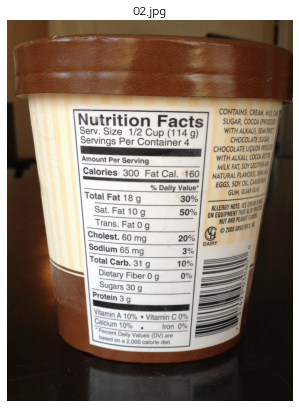

In [98]:
show_image(img_path_list[img_idx], img_name_list[img_idx], figsize)

#### 모듈 실행 후 결과 저장
- google ocr api

In [99]:
google_res = test_google(img_path_list[img_idx])
google_report = Report('GOOGLE-OCR-API', img_path_list[img_idx], 'eng')
google_report.summary(google_res)

- keras ocr

In [100]:
keras_res = test_keras_ocr(img_path_list[img_idx], pipeline)
keras_report = Report('KERAS-OCR', img_path_list[img_idx], 'eng')
keras_report.summary(keras_res)

- tesseract

In [101]:
tesseract_res = test_tesseract(img_path_list[img_idx], 'eng')
tesseract_report = Report('TESSERACT', img_path_list[img_idx], 'eng')
tesseract_report.summary(tesseract_res)

####  detection rate 계산
- 이번 데이터에서 찾아내야하는 영역은 총 20개(Calories, 300, Total Fat, 18g, Sat Fat, 10g, Trans Fat, 0g, Cholesterol, 60mg, Sodium, 65mg, Total Carb, 31g, Dietary Fiber, 0g, Sugars, 30g, Protein, 3g)이다.
- bounding box 출력

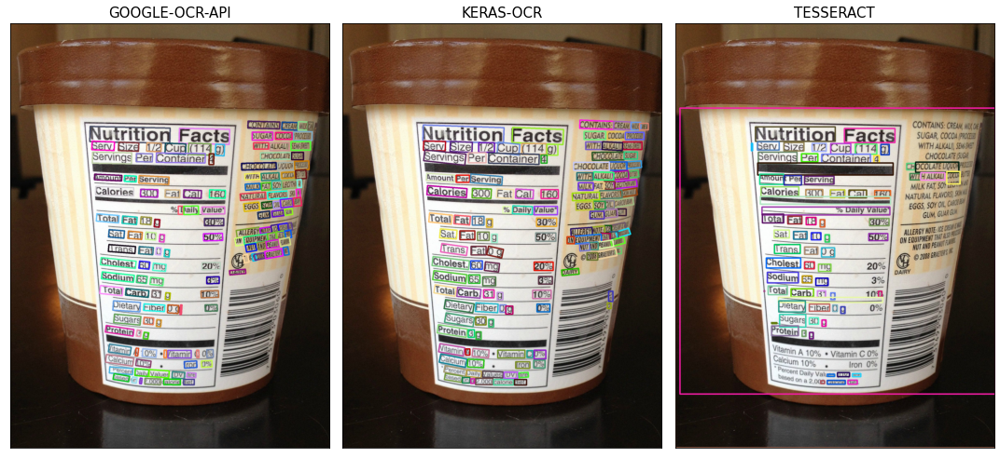

In [37]:
fig, axes = plt.subplots(1, 3, figsize=(15, 8))
bounds_imgs = [google_report.get_img_with_bounds(thickness=5),
               keras_report.get_img_with_bounds(thickness=5),
               tesseract_report.get_img_with_bounds(thickness=5)]

for i, ax in enumerate(axes):
    ax.imshow(cv2.cvtColor(bounds_imgs[i], cv2.COLOR_BGR2RGB))
    ax.set_title(module_names[i], fontsize=15)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.tight_layout()
plt.show()

- detection rate 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾은 정보 | Calories, 300, Total Fat, 18g, Sat Fat, 10g, Trans Fat, 0g, Cholesterol, 60mg, Sodium, 65mg, Total Carb, 31g, Dietary Fiber, 0g, Sugars, 30g, Protein, 3g | Calories, 300, Total Fat, 18g, Sat Fat, 10g, Trans Fat, 0g, Cholesterol, 60mg, Sodium, 65mg, Total Carb, 31g, Dietary Fiber, 0g, Sugars, 30g, Protein, 3g | Calories, 300, Total Fat, 18g, Sat Fat, 10g, Trans Fat, 0g, Cholesterol, 60mg, Sodium, 65mg, Total Carb, 31g, Dietary Fiber, 0g, Sugars, 30g, Protein, 3g |
| 찾은 정보의 개수 | 20 | 20 | 20 |
| detection rate | 1 | 1 | 1 |

In [102]:
google_report.set_detection_rate(1)
keras_report.set_detection_rate(1)
tesseract_report.set_detection_rate(1)

#### recognition rate/racognition accuracy 계산
- 각 Report에서 recognition 결과 저장

In [39]:
google_report.get_recognition_results((5, 60), save=True, show=False)
keras_report.get_recognition_results((5, 60), save=True, show=False)
tesseract_report.get_recognition_results((5, 30), save=True, show=False)

save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/google_ocr_api/02.png
save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/keras_ocr/02.png
save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/tesseract/02.png


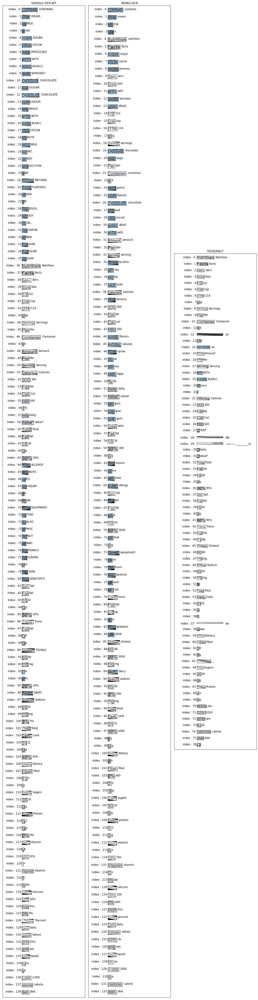

In [41]:
show_images([google_result_path + '/02.png',
             keras_result_path + '/02.png',
             tesseract_result_path + '/02.png'],
            module_names, figsize=(15, 60), col_num=3)

- recognition rate 계산 

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾아낸 관심 영역의 인덱스 | 51, 52, 59-60, 61-62, 81-82, 83-84, 86-87, 88-89, 90, 91-92, 97, 98-99, 101-102. 103-104, 106-107, 108, 110, 111-112, 113, 114-115  | 38, 40, 56-57, [58, 60], [65, 67], [69, 72], 79-80, 81, 85, [86, 88], 90, [91, 93], 94-95, [96, 99],  [100, 102], 104-105, 106, 107-108, 109, 110-111  | 22, 23, 32-33, 34-35, 37-38, 39-40, 42-43, 44, 45, 46-47, 48, 49-50, 52-53, 54-55, 59-60, 61-62, 64, 65-66, 64, 68-69 |
| 관심 영역에서 recognition이 성공한 횟수 | 20 | 20 | 20 |
| recognition rate | 1 | 1 | 1 |

In [103]:
google_report.set_recognition_rate(1)
keras_report.set_recognition_rate(1)
tesseract_report.set_recognition_rate(1)

- recognition accuracy - 1) 기댓값(라벨)과 recognition 결과값

|  기댓값  | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| Calories        |  Calories         |  Calories              |  Calories      |
| 300               |   300               | 300                      | 300       | 
| Total Fat       |  Total Fat       |  Total Fat             | Total Fat        |
| 18g               |  18g                | 18g                      | 18g       |
| Sat Fat          |  Sat Fat          |  Sat Fat                |   Sat Fat      |
| 10g               |  10g                | 10g                      |  10g      |
| Trans Fat      | Trans Fat        |  Trans Fat           | Trans Fat      |
| 0g                 |  0g                  |   og                       |  0g      |
| Cholest        | Cholest            |  Cholest                |   Cholest     |
| 60mg            | 60mg               | 60mg                    | 60mg       |
| Sodium         | Sodium            |  Sodium                 | Sodium       |
| 65mg            |  65mg              | 65mg                    | 65mg       |
| Total Carb    |  Total Carb      | Total Carb            | Total Carb       |
| 31g               |  31g                 | 31g                       | 31g       |
| Dietary Fiber | Dietary Fiber  | Dietary Fiber       |  Dietary Fiber      |
| 0g                  |  0g                  |   og                      | 0g       |
| Sugars           | Sugars             | Sugars                 | Sugars       |
| 30g                | 30g                 | 30g                      |  30g      |
| Protein          | Protein           | Protein               | Protein       |
| 3g                  | 3g                   | 3g                      | 3g       |


- recognition accuracy - 2) recognition accuracy 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| 기댓값과 일치하는 recognition 결과값의 수 | 20 | 18 | 20 |
| recognition accuracy | 1 | 18/20≓0.9 | 1 |

In [104]:
google_report.set_recognition_accuracy(1)
keras_report.set_recognition_accuracy(18/20)
tesseract_report.set_recognition_accuracy(1)

#### 업데이트 된 Report 저장

In [105]:
reports['GOOGLE-OCR-API'].append(google_report)
reports['KERAS-OCR'].append(keras_report)
reports['TESSERACT'].append(tesseract_report)

### [T3] Nutrition Facts-ENG-3

#### 이미지 확인

In [106]:
figsize = (7, 7)
img_idx = 2

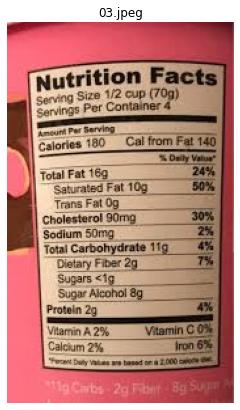

In [44]:
show_image(img_path_list[img_idx], img_name_list[img_idx], figsize)

#### 모듈 실행 후 결과 저장
- google ocr api

In [107]:
google_res = test_google(img_path_list[img_idx])
google_report = Report('GOOGLE-OCR-API', img_path_list[img_idx], 'eng')
google_report.summary(google_res)

- keras ocr

In [108]:
keras_res = test_keras_ocr(img_path_list[img_idx], pipeline)
keras_report = Report('KERAS-OCR', img_path_list[img_idx], 'eng')
keras_report.summary(keras_res)

- tesseract

In [109]:
tesseract_res = test_tesseract(img_path_list[img_idx], 'eng')
tesseract_report = Report('TESSERACT', img_path_list[img_idx], 'eng')
tesseract_report.summary(tesseract_res)

In [110]:
tesseract_res

{'level': [1, 2, 3, 4, 5],
 'page_num': [1, 1, 1, 1, 1],
 'block_num': [0, 1, 1, 1, 1],
 'par_num': [0, 0, 1, 1, 1],
 'line_num': [0, 0, 0, 1, 1],
 'word_num': [0, 0, 0, 0, 1],
 'left': [0, 0, 0, 0, 0],
 'top': [0, 0, 0, 0, 0],
 'width': [173, 173, 173, 173, 173],
 'height': [291, 291, 291, 291, 291],
 'conf': ['-1', '-1', '-1', '-1', 95],
 'text': ['', '', '', '', '']}

이번 케이스에서 Tesseract는 어떤 문자도 인식하지 못했다.

####  detection rate 계산
- 이번 데이터에서 찾아내야하는 영역은 총 20개(Calories, 180, Total Fat, 18g, Saturated Fat, 10g, Trans Fat, 0g, Cholesterol, 90mg, Sodium, 50mg, Total Carbohydrate, 11g, Dietary Fiber, 2g, Sugars, 1g, Protein, 2g)이다.
- bounding box 출력

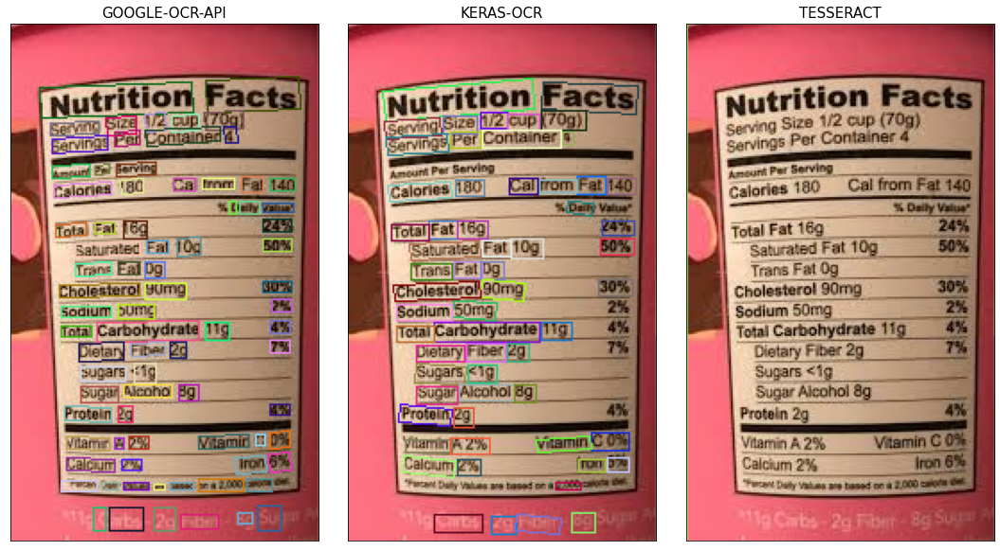

In [51]:
fig, axes = plt.subplots(1, 3, figsize=(15, 8))
bounds_imgs = [google_report.get_img_with_bounds(thickness=1),
               keras_report.get_img_with_bounds(thickness=1),
               tesseract_report.get_img_with_bounds(thickness=1)]

for i, ax in enumerate(axes):
    ax.imshow(cv2.cvtColor(bounds_imgs[i], cv2.COLOR_BGR2RGB))
    ax.set_title(module_names[i], fontsize=15)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.tight_layout()
plt.show()

- detection rate 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾은 정보 | Calories, 180, Total Fat, 18g, Saturated Fat, 10g, Trans Fat, 0g, Cholesterol, 90mg, Sodium, 50mg, Total Carbohydrate, 11g, Dietary Fiber, 2g, Sugars, 1g, Protein, 2g | Calories, 180, Total Fat, 18g, Saturated Fat, 10g, Trans Fat, 0g, Cholesterol, 90mg, Sodium, 50mg, Total Carbohydrate, 11g, Dietary Fiber, 2g, Sugars, 1g, Protein, 2g | - | 
| 찾은 정보의 개수 | 20 | 20 | 0 |
| detection rate | 1 | 1 | 0 |

In [111]:
google_report.set_detection_rate(1)
keras_report.set_detection_rate(1)
tesseract_report.set_detection_rate(0)

#### recognition rate/racognition accuracy 계산
- 각 Report에서 recognition 결과 저장

In [53]:
google_report.get_recognition_results((5, 35), save=True, show=False)
keras_report.get_recognition_results((5, 35), save=True, show=False)

save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/google_ocr_api/03.png
save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/keras_ocr/03.png


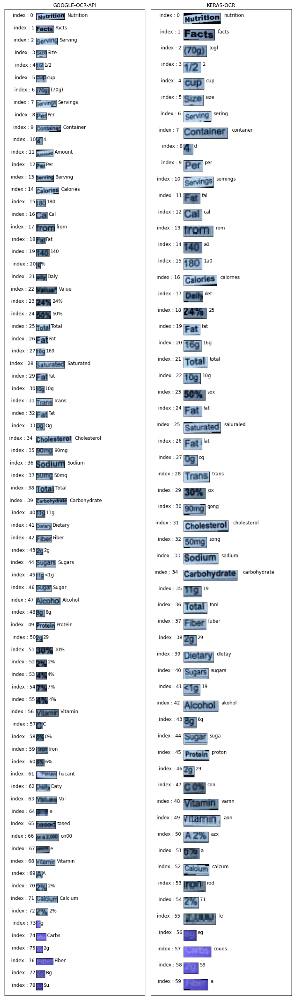

In [54]:
show_images([google_result_path + '/03.png',
             keras_result_path + '/03.png'],
            module_names, figsize=(10, 35), col_num=2)

- recognition rate 계산 

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾아낸 관심 영역의 인덱스 |  14, 15, 25-26, 27, 28-29, 30, 31-32, 33, 34, 35, 36, 37, 38-39, 40, 41-42, 43, 44, 45, 49, 50 | 16, 15,  [21, 19], 20, 25-24, 22,  [28, 26], 27, 31, 30, 33, 32, [34, 36], 35, [39. 37], 38, 40, 41, 45, 26 | - |
| 관심 영역에서 recognition이 성공한 횟수 | 20 | 20 | - |
| recognition rate | 1 | 1 | - |

In [112]:
google_report.set_recognition_rate(1)
keras_report.set_recognition_rate(1)

- recognition accuracy - 1) 기댓값(라벨)과 recognition 결과값

|  기댓값  | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| Calories | Calories | Calories | - |
| 180 |  180 | 1a0 | - |
| Total Fat | Total Fat | Total Fat | - |
| 16g | 169 | 16g | - |
| Saturated Fat | Saturated Fat | Saluraled Fat | - |
| 10g | 10g | 10g | - |
| Trans Fat | Trans Fat  | Trans Fat | -  |
| 0g | Og | og | - |
| Cholesterol |  Cholesterol | Cholesterol | - |
| 90mg | 90mg  | gong | - |
| Sodium | Sodium  | Sodium | - |
| 50mg | 50mg  | song | - |
| Total Carbohydrate | Total Carbohydrate  | tonl carbohydrate | - |
| 11g | 11g  | 19 | - |
| Dietary Fiber |  Dietary Fiber | dletay fuber | -  |
| 2g | 2g  | 29  | - |
| Sugars | Sugars  | Sugars | - |
| 1g | 1g  | 19 | - |
| Protein | Protein  | proton | - |
| 2g | 29 | 29 | - |

- recognition accuracy - 2) recognition accuracy 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| 기댓값과 일치하는 recognition 결과값의 수 | 17 | 8 | - |
| recognition accuracy | 17/20=0.85 | 8/20=0.4 | - |

In [113]:
google_report.set_recognition_accuracy(17/20)
keras_report.set_recognition_accuracy(8/20)

#### 업데이트 된 Report 저장

In [114]:
reports['GOOGLE-OCR-API'].append(google_report)
reports['KERAS-OCR'].append(keras_report)
reports['TESSERACT'].append(tesseract_report)

### [T4] Nutrition Facts-KOR-1

#### 한글폰트 설정

In [53]:
# 사용가능한 한글 폰트 확인
import matplotlib.font_manager
print([f.name for f in matplotlib.font_manager.fontManager.ttflist if 'Nanum' in f.name])

# 기본 설정 확인
import matplotlib.pyplot as plt

# size, family
print (plt.rcParams['font.size'] ) 
print (plt.rcParams['font.family'] )

# 폰트의 기본값 변경
plt.rcParams["font.family"] = 'NanumSquare'

['NanumSquareRound', 'NanumBarunpen', 'NanumSquare', 'NanumSquareRound', 'NanumGothicCoding', 'NanumSquareRound', 'NanumBarunGothic', 'NanumBarunpen', 'NanumMyeongjo', 'NanumBarunGothic', 'NanumGothic', 'Nanum Brush Script', 'NanumGothic', 'NanumGothic', 'NanumBarunGothic', 'NanumBarunGothic', 'NanumSquare', 'NanumGothicCoding', 'NanumMyeongjo', 'Nanum Pen Script', 'NanumSquare', 'NanumSquare', 'NanumSquareRound', 'NanumMyeongjo', 'NanumGothic']
10.0
['sans-serif']


#### 이미지 확인

In [115]:
figsize = (7, 7)
img_idx = 3

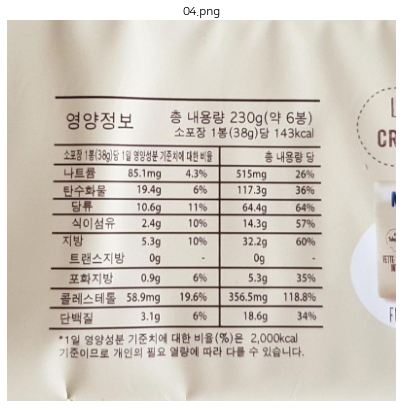

In [116]:
show_image(img_path_list[img_idx], img_name_list[img_idx], figsize)

#### 모듈 실행 후 결과 저장

- google ocr api

In [117]:
google_res = test_google(img_path_list[img_idx])
google_report = Report('GOOGLE-OCR-API', img_path_list[img_idx], 'eng+kor')
google_report.summary(google_res)

- keras ocr

In [118]:
keras_res = test_keras_ocr(img_path_list[img_idx], pipeline)
keras_report = Report('KERAS-OCR', img_path_list[img_idx], 'eng+kor')
keras_report.summary(keras_res)

- tesseract

In [119]:
tesseract_res = test_tesseract(img_path_list[img_idx], 'eng+kor')
tesseract_report = Report('TESSERACT', img_path_list[img_idx], 'eng+kor')
tesseract_report.summary(tesseract_res)

####  detection rate 계산
- 이번 데이터에서 찾아내야하는 영역은 총 19개(143kcal, 나트륨, 85.1mg, 탄수화물, 19.4g, 당류, 10.6g, 식이섬유, 2.4g, 지방, 5.3g, 트랜스지방, 0g, 포화지방, 0.9g, 콜레스테롤, 58.9mg, 단백질, 3.1g)이다.
- bounding box 출력

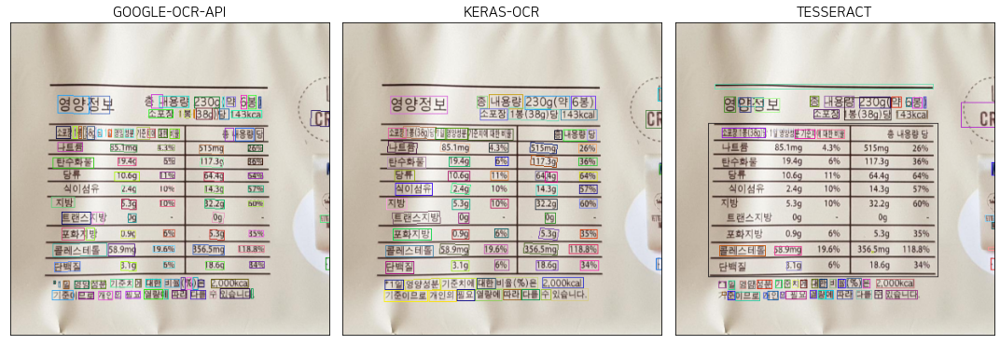

In [61]:
fig, axes = plt.subplots(1, 3, figsize=(15, 8))
bounds_imgs = [google_report.get_img_with_bounds(thickness=1),
               keras_report.get_img_with_bounds(thickness=1),
               tesseract_report.get_img_with_bounds(thickness=1)]

for i, ax in enumerate(axes):
    ax.imshow(cv2.cvtColor(bounds_imgs[i], cv2.COLOR_BGR2RGB))
    ax.set_title(module_names[i], fontsize=15)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.tight_layout()
plt.show()

- detection rate 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾은 정보 | 143kcal, 나트륨, 85.1mg, 탄수화물, 19.4g, 10.6g, 2.4g, 지방, 5.3g, 트랜스지방, 0g, 0.9g, 콜레스테롤, 58.9mg, 단백질, 3.1g | 143kcal, 나트륨, 85.1mg, 탄수화물, 19.4g, 당류, 10.6g, 식이섬유, 2.4g, 지방, 5.3g, 트랜스지방, 0g, 포화지방, 0.9g, 콜레스테롤, 58.9mg, 단백질, 3.1g | 143kcal, 콜레스테롤, 58.9mg, 3.1g | 
| 찾은 정보의 개수 | 16 | 19 | 4 |
| detection rate | 16/19 ≓ 0.842105263 | 1 | 4/19 ≓ 0.210526316 |

In [120]:
google_report.set_detection_rate(16/19)
keras_report.set_detection_rate(1)
tesseract_report.set_detection_rate(4/19)

#### recognition rate/racognition accuracy 계산
- 각 Report에서 recognition 결과 저장

In [66]:
google_report.get_recognition_results((3, 40), save=True, show=False)
keras_report.get_recognition_results((4, 35), save=True, show=False)
tesseract_report.get_recognition_results((6, 25), save=True, show=False)

save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/google_ocr_api/04.png
save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/keras_ocr/04.png
save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/tesseract/04.png


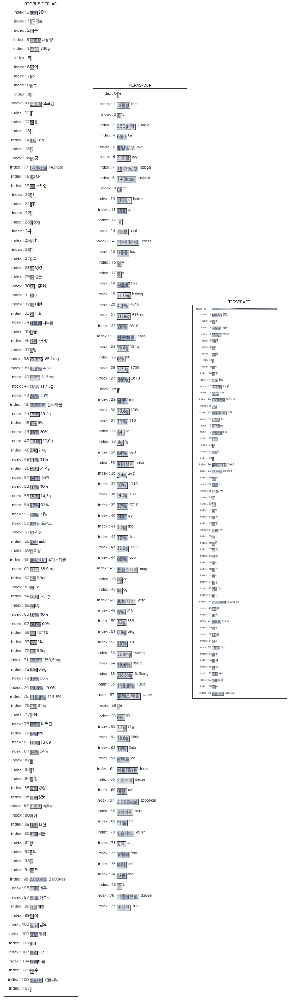

In [63]:
show_images([google_result_path + '/04.png',
             keras_result_path + '/04.png',
             tesseract_result_path + '/04.png'],
            module_names, figsize=(12, 40), col_num=3)

- recognition rate 계산 

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾아낸 관심 영역의 인덱스 | 17, 34, 38, 43, 44, 47, 48, 55, 62, 56-57, 63, 72, 60, 61, 78, 76 |  |  |
| 관심 영역에서 recognition이 성공한 횟수 | 16 | 8, 18, 19, 23, 24, 29, 30, 35, 36, 40, 41, 45, 46, 48, 51, 57, 53, 63, 60 | 14, 24, 25, 28 |
| recognition rate | 1 | 1 | 1 |

In [121]:
google_report.set_recognition_rate(1)
keras_report.set_recognition_rate(1)
tesseract_report.set_recognition_rate(1)

- recognition accuracy - 1) 기댓값(라벨)과 recognition 결과값

|  기댓값  | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| 143kcal | 143kcal | laskcal | 143kacl |
| 나트륨 |  나트륨 | hea | - |
| 85.1mg | 85.1mg | bsimg | - |
| 탄수화물 | 탄수화물 | eass | - |
| 19.4g | 19.4g | 194g | - |
| 당류 | - | an | - |
| 10.6g | 10.6g | 106g | -  |
| 식이섬유 | - | nolan | - |
| 2.4g | 2.4g  | 24g | - |
| 지방 | 지방  | xiy | - |
| 5.3g |  5.3g  | sbg | - |
| 트랜스지방 |  트랜스지방 | eeay | - |
| 0g | 0g  | og | - |
| 포화지방 | 포화지방  | yetg | - |
| 0.9g |   0.9g | o9g | -  |
| 콜레스테롤 |  콜레스테롤 | saaer  | BBAS |
| 58.9mg | 58.9mg  | saaer | 58.9mq |
| 단백질 |  단백질 | ee | - |
| 3.1g | 3.1g  | 31g | 379 |

- recognition accuracy - 2) recognition accuracy 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| 기댓값과 일치하는 recognition 결과값의 수 | 17 | 0 | 0 |
| recognition accuracy | 1 | 0 | 0 |

In [122]:
google_report.set_recognition_accuracy(1)
keras_report.set_recognition_accuracy(0)
tesseract_report.set_recognition_accuracy(0)

#### 업데이트 된 Report 저장

In [123]:
reports['GOOGLE-OCR-API'].append(google_report)
reports['KERAS-OCR'].append(keras_report)
reports['TESSERACT'].append(tesseract_report)

### [T5] Nutrition Facts-KOR-2

#### 이미지 확인

In [124]:
figsize = (4, 7)
img_idx = 4

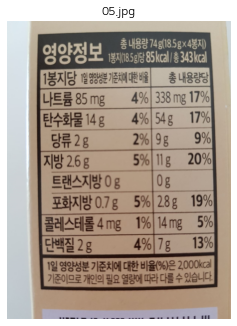

In [125]:
show_image(img_path_list[img_idx], img_name_list[img_idx], figsize)

#### 모듈 실행 후 결과 저장
- google ocr api

In [126]:
google_res = test_google(img_path_list[img_idx])
google_report = Report('GOOGLE-OCR-API', img_path_list[img_idx], 'eng+kor')
google_report.summary(google_res)

- keras ocr

In [127]:
keras_res = test_keras_ocr(img_path_list[img_idx], pipeline)
keras_report = Report('KERAS-OCR', img_path_list[img_idx], 'eng+kor')
keras_report.summary(keras_res)

- tesseract

In [128]:
tesseract_res = test_tesseract(img_path_list[img_idx], 'eng+kor')
tesseract_report = Report('TESSERACT', img_path_list[img_idx], 'eng+kor')
tesseract_report.summary(tesseract_res)

In [129]:
tesseract_res

{'level': [1],
 'page_num': [1],
 'block_num': [0],
 'par_num': [0],
 'line_num': [0],
 'word_num': [0],
 'left': [0],
 'top': [0],
 'width': [680],
 'height': [907],
 'conf': ['-1'],
 'text': ['']}

이번 케이스에서 Tesseract는 어떤 문자도 인식하지 못했다.

####  detection rate 계산
- 이번 데이터에서 찾아내야하는 영역은 총 17개(343kcal, 나트륨, 85mg, 탄수화물, 14g, 당류, 2g, 지방, 2.6g, 트랜스지방, 0g, 포화지방, 0.7g, 콜레스테롤, 4mg, 단백질, 2g)이다.
- bounding box 출력

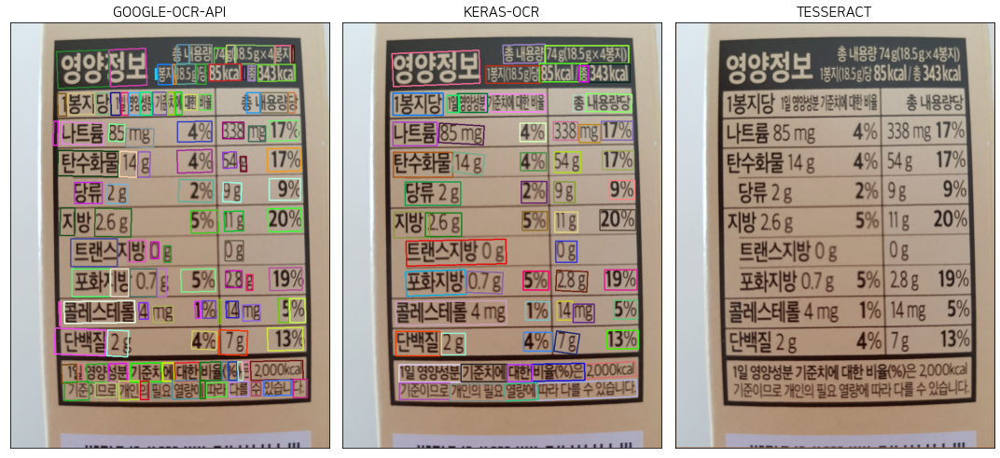

In [81]:
fig, axes = plt.subplots(1, 3, figsize=(15, 8))
bounds_imgs = [google_report.get_img_with_bounds(thickness=2),
               keras_report.get_img_with_bounds(thickness=2),
               tesseract_report.get_img_with_bounds(thickness=2)]

for i, ax in enumerate(axes):
    ax.imshow(cv2.cvtColor(bounds_imgs[i], cv2.COLOR_BGR2RGB))
    ax.set_title(module_names[i], fontsize=15)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.tight_layout()
plt.show()

- detection rate 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾은 정보 | 343kcal, 나트륨, 85mg, 탄수화물, 14g, 당류, 2g, 2.6g, 0g, 포화지방, 0.7g, 콜레스테롤, 4mg, 단백질, 2g | 343kcal, 나트륨, 85mg, 탄수화물, 14g, 당류, 2g, 지방, 2.6g, 트랜스지방, 0g, 포화지방, 0.7g, 콜레스테롤, 4mg, 단백질, 2g | - | 
| 찾은 정보의 개수 | 17 | 17 | 0 |
| detection rate | 1 | 1 | 0 |

In [130]:
google_report.set_detection_rate(1)
keras_report.set_detection_rate(1)
tesseract_report.set_detection_rate(0)

#### recognition rate/racognition accuracy 계산
- 각 Report에서 recognition 결과 저장

In [86]:
google_report.get_recognition_results((3, 40), save=True, show=False)
keras_report.get_recognition_results((3, 30), save=True, show=False)

save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/google_ocr_api/05.png
save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/keras_ocr/05.png


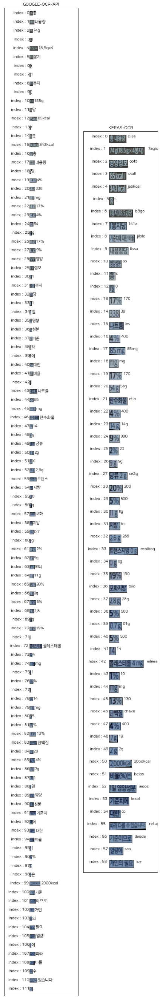

In [87]:
show_images([google_result_path + '/05.png',
             keras_result_path + '/05.png'],
            module_names, figsize=(6, 40), col_num=2)

- recognition rate 계산 

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾아낸 관심 영역의 인덱스 | 15, 43, 44-45, 46, 47-48, 49, 50, 53-54, 55-56, 57-58, 59-60, 72, 73-74, 84 |  | 4, 15, 17, 21, 23, 27, 27, 31, 32, 33, 33, 36, 39, 42, 42, 46. 49 | - |
| 관심 영역에서 recognition이 성공한 횟수 | 17 | 17 | - |
| recognition rate | 1 | 1 | - |

In [131]:
google_report.set_recognition_rate(1)
keras_report.set_recognition_rate(1)

- recognition accuracy - 1) 기댓값(라벨)과 recognition 결과값

|  기댓값  | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| 343kcal | 343kcal | jabkcal | - |
| 나트륨 |  나트륨 | les | - |
| 85mg | 85mg | 85mg | - |
| 탄수화물 | 탄수화물 | etin | - |
| 14g | 14g | 14g | - |
| 당류 | 당류 | ce| - |
| 2g | 2g | 2g | -  |
| 지방 | 지방  | to | - |
| 2.6g |  2.6g  | 269 | - |
| 트랜스지방 |  트랜스지방 | eeaib | - |
| 0g | 0g  | og | - |
| 포화지방 | 포화지방  | toio | - |
| 0.7g |  0.7g | 01g | -  |
| 콜레스테롤 |  콜레스테롤 | eile | - |
| 4mg | 4mg  | ea | - |
| 단백질 |  단백질 | chake | - |
| 2g | 28  | 2g | - |

- recognition accuracy - 2) recognition accuracy 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| 기댓값과 일치하는 recognition 결과값의 수 | 16 | 4 | - |
| recognition accuracy | 16/17 ≓ 0.941176471 | 5/17 ≓ 0.235294118 | - |

In [132]:
google_report.set_recognition_accuracy(16/17)
keras_report.set_recognition_accuracy(5/17)

#### 업데이트 된 Report 저장

In [133]:
reports['GOOGLE-OCR-API'].append(google_report)
reports['KERAS-OCR'].append(keras_report)
reports['TESSERACT'].append(tesseract_report)

### [T6] Nutrition Facts-KOR-3

In [134]:
figsize = (4, 7)
img_idx = 5

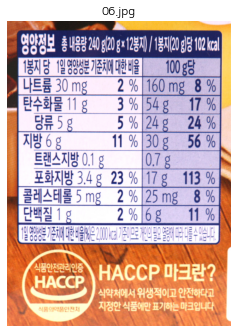

In [135]:
show_image(img_path_list[img_idx], img_name_list[img_idx], figsize)

#### 모듈 실행 후 결과 저장
- google ocr api

In [136]:
google_res = test_google(img_path_list[img_idx])
google_report = Report('GOOGLE-OCR-API', img_path_list[img_idx], 'eng+kor')
google_report.summary(google_res)

- keras ocr

In [137]:
keras_res = test_keras_ocr(img_path_list[img_idx], pipeline)
keras_report = Report('KERAS-OCR', img_path_list[img_idx], 'eng+kor')
keras_report.summary(keras_res)

- tesseract

In [138]:
tesseract_res = test_tesseract(img_path_list[img_idx], 'eng+kor')
tesseract_report = Report('TESSERACT', img_path_list[img_idx], 'eng+kor')
tesseract_report.summary(tesseract_res)

####  detection rate 계산
- 이번 데이터에서 찾아내야하는 영역은 총 17개(102kcal, 나트륨, 30mg, 탄수화물, 11g, 당류, 5g, 지방, 6g, 트랜스지방, 0.1g, 포화지방, 3.4g, 콜레스테롤, 5mg, 단백질, 1g)이다.
- bounding box 출력

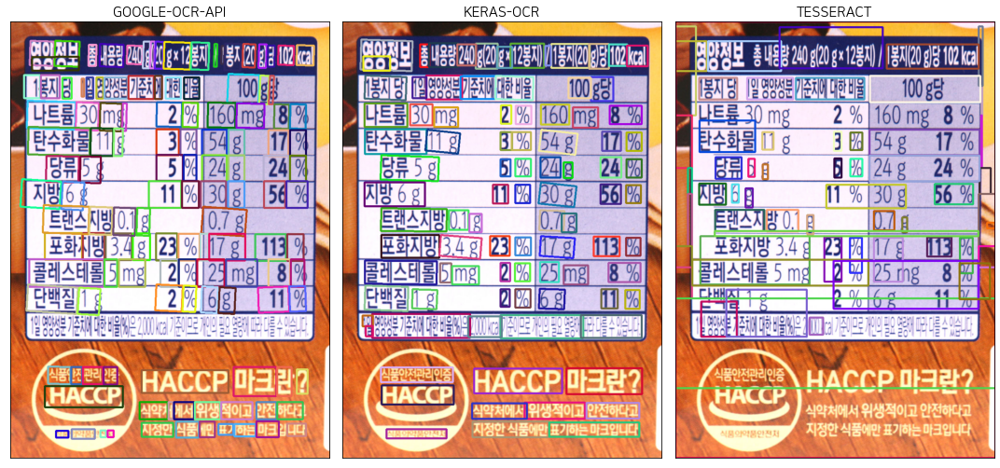

In [95]:
fig, axes = plt.subplots(1, 3, figsize=(15, 8))
bounds_imgs = [google_report.get_img_with_bounds(thickness=3),
               keras_report.get_img_with_bounds(thickness=3),
               tesseract_report.get_img_with_bounds(thickness=3)]

for i, ax in enumerate(axes):
    ax.imshow(cv2.cvtColor(bounds_imgs[i], cv2.COLOR_BGR2RGB))
    ax.set_title(module_names[i], fontsize=15)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.tight_layout()
plt.show()

- detection rate 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾은 정보 | 102kcal, 나트륨, 30mg, 탄수화물, 11g, 당류, 5g, 지방, 6g, 트랜스지방, 0.1g, 포화지방, 3.4g, 콜레스테롤, 5mg, 단백질, 1g | 102kcal, 나트륨, 30mg, 탄수화물, 11g, 당류, 5g, 지방, 6g, 트랜스지방, 0.1g, 포화지방, 3.4g, 콜레스테롤, 5mg, 단백질, 1g | 102kcal, 탄수화물, 당류, 5g, 지방, 6g, 트랜스지방, 0.1g, 포화지방, 3.4g, 콜레스테롤, 5mg | 
| 찾은 정보의 개수 | 17 | 17 | 12 |
| detection rate | 1 | 1 | 12/17 ≓ 0.705882353 |

#### recognition rate/racognition accuracy 계산
- 각 Report에서 recognition 결과 저장

In [139]:
google_report.set_detection_rate(1)
keras_report.set_detection_rate(1)
tesseract_report.set_detection_rate(12/17)

#### recognition rate/racognition accuracy 계산
- 각 Report에서 recognition 결과 저장

In [105]:
google_report.get_recognition_results((4, 50), save=True, show=False)
keras_report.get_recognition_results((4, 40), save=True, show=False)
tesseract_report.get_recognition_results((4, 30), save=True, show=False)

save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/google_ocr_api/06.png
save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/keras_ocr/06.png
save /home/aiffel-dj1/workspace/aiffel-exploration-workspace/E18_OCR/Nutrition_Facts/recognition_results/tesseract/06.png


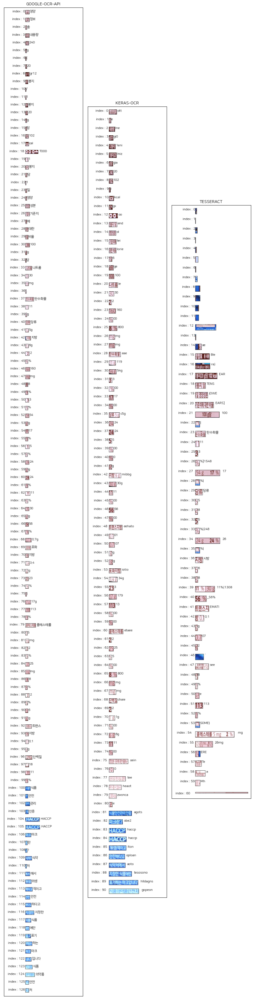

In [110]:
show_images([google_result_path + '/06.png',
             keras_result_path + '/06.png',
             tesseract_result_path + '/06.png'],
            module_names, figsize=(10, 50), col_num=3)

- recognition rate 계산 

|              | google-ocr-api | keras-ocr | tesseract |
|:--------|:--------------:|:---------:|:--------:|
| 찾아낸 관심 영역의 인덱스 | 16-17, 33, 34-15, 37, 38-39, 40, 41, 42, 43, 92-93, 94-95, 69-70, 71-72, 79, 80-81, 96, 97 | [8,10], 20,[21, 26], 28, 29, 35, 35, 42, 42, 48, [49, 51], 53, 54, 60, [63, 67], 68, 70  | 17, 23,  29, 30-31, 36 , 37-38, 41-42, 42-43, 47, 47, 47, 47|
| 관심 영역에서 recognition이 성공한 횟수 | 17 | 17 | 12 |
| recognition rate | 1 | 1 | 1 |

In [140]:
google_report.set_recognition_rate(1)
keras_report.set_recognition_rate(1)
tesseract_report.set_recognition_rate(1)

- recognition accuracy - 1) 기댓값(라벨)과 recognition 결과값

|  기댓값  | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| 102kcal |  102kcal | 102kcal  | EAR  |
| 나트륨 |  나트륨 |  le | -  |
| 30mg | 30mg  |  30mg | -  |
| 탄수화물 | 탄수화물  |  eae |  탄수화물 |
| 11g |  11g | 119  | - |
| 당류 | 당류  | c  |  당류 |
| 5g | 5g  |  5g | 58  |
| 지방 | 지방  |  mib | 시방  |
| 6g |  6g |  bg | 68  |
| 트랜스지방 | 트랜스지방  |  eehato |  EMATI |
| 0.1g |  1g |  01g |  0.1g |
| 포화지방 | 포화지방 | totio  | see  |
| 3.4g | 3.4g  | 34g  | see  |
| 콜레스테롤 |  콜레스테롤 | etaee  | see  |
| 5mg | 5mg  |  5mg | see  |
| 단백질 | 단백질  | chaie  | - |
| 1g | 18  |  1g | - |

- recognition accuracy - 2) recognition accuracy 계산

|              | google-ocr-api | keras-ocr | tesseract |
|:-------:|:--------------:|:---------:|:--------:|
| 기댓값과 일치하는 recognition 결과값의 수 | 15 | 5 | 3 |
| recognition accuracy | 15/17 ≓ 0.882352941 | 5/17 ≓ 0.294117647 | 3/12 ≓ 0.25 |

In [141]:
google_report.set_recognition_accuracy(15/17)
keras_report.set_recognition_accuracy(5/17)
tesseract_report.set_recognition_accuracy(3/12)

#### 업데이트 된 Report 저장

In [142]:
reports['GOOGLE-OCR-API'].append(google_report)
reports['KERAS-OCR'].append(keras_report)
reports['TESSERACT'].append(tesseract_report)

## STEP3. 테스트 결과 분석
---

### 데이터 프레임 생성

분석에 앞서 Report 객체에서 지표 데이터만을 뽑아내 DataFrame로 정리한다.

- DataFrame를 만들 data 생성

In [155]:
cnt_test_case = 6

test_result_summary = { # 테스트 케이스 별 google-ocr-api 결과
    'GOOGLE-OCR-API': {
        "detection_rate": [],
        "recognition_rate": [],
        "recognition_accuracy": []
    },
    'KERAS-OCR': { # 테스트 케이스 별 keras-ocr 결과
        "detection_rate": [],
        "recognition_rate": [],
        "recognition_accuracy": []
    },
    'TESSERACT': { # 테스트 케이스 별 tesseract 결과
        "detection_rate": [],
        "recognition_rate": [],
        "recognition_accuracy": []
    },
    'detection_rate': { # 테스트 케이스 별 module에 따른 detection_rate
        "GOOGLE-OCR-API": [],
        "KERAS-OCR": [],
        "TESSERACT": []
    },
    'recognition_rate': { # 테스트 케이스 별 module에 따른 recognition_rate
        "GOOGLE-OCR-API": [],
        "KERAS-OCR": [],
        "TESSERACT": []
    },
    'recognition_accuracy': {# 테스트 케이스 별 module에 따른 recognition_accuracy
        "GOOGLE-OCR-API": [],
        "KERAS-OCR": [],
        "TESSERACT": []
    } 
}

for module_name in module_names:
    reports_per_module = reports[module_name]
    
    for report in reports_per_module:
        cur_recognition_rate = report.recognition_rate
        if cur_recognition_rate == -1 : cur_recognition_rate = np.nan
            
        cur_recognition_accuracy = report.recognition_accuracy
        if cur_recognition_accuracy == -1 : cur_recognition_accuracy = np.nan
        
        test_result_summary[module_name]["detection_rate"].append(report.detection_rate)
        test_result_summary[module_name]["recognition_rate"].append(cur_recognition_rate)
        test_result_summary[module_name]["recognition_accuracy"].append(cur_recognition_accuracy)
        test_result_summary["detection_rate"][module_name].append(report.detection_rate)
        test_result_summary["recognition_rate"][module_name].append(cur_recognition_rate)
        test_result_summary["recognition_accuracy"][module_name].append(cur_recognition_accuracy)

- DataFrame 생성

In [162]:
import pandas as pd

indexs = [f'T{i}' for i in range(1, 7)]
test_result_df = { # 테스트 케이스 별 google-ocr-api 결과
    'GOOGLE-OCR-API': pd.DataFrame(test_result_summary['GOOGLE-OCR-API'], index=indexs),
    'KERAS-OCR': pd.DataFrame(test_result_summary['KERAS-OCR'], index=indexs),
    'TESSERACT': pd.DataFrame(test_result_summary['TESSERACT'], index=indexs),
    'detection_rate': pd.DataFrame(test_result_summary['detection_rate'], index=indexs),
    'recognition_rate': pd.DataFrame(test_result_summary['recognition_rate'], index=indexs),
    'recognition_accuracy': pd.DataFrame(test_result_summary['recognition_accuracy'], index=indexs)
}

- DataFrame 확인

In [175]:
for df_name in test_result_df:
    print(f'🗒️ {df_name}')
    display(test_result_df[df_name])
    print()

🗒️ GOOGLE-OCR-API


,detection_rate,recognition_rate,recognition_accuracy
T1,1.000000,1,1.000000
T2,1.000000,1,1.000000
T3,1.000000,1,0.850000
T4,0.842105,1,1.000000
T5,1.000000,1,0.941176
T6,1.000000,1,0.882353



🗒️ KERAS-OCR


,detection_rate,recognition_rate,recognition_accuracy
T1,1,1,0.894737
T2,1,1,0.900000
T3,1,1,0.400000
T4,1,1,0.000000
T5,1,1,0.294118
T6,1,1,0.294118



🗒️ TESSERACT


,detection_rate,recognition_rate,recognition_accuracy
T1,0.947368,1.0,0.444444
T2,1.000000,1.0,1.000000
T3,0.000000,NaN,NaN
T4,0.210526,1.0,0.000000
T5,0.000000,NaN,NaN
T6,0.705882,1.0,0.250000



🗒️ detection_rate


,GOOGLE-OCR-API,KERAS-OCR,TESSERACT
T1,1.000000,1,0.947368
T2,1.000000,1,1.000000
T3,1.000000,1,0.000000
T4,0.842105,1,0.210526
T5,1.000000,1,0.000000
T6,1.000000,1,0.705882



🗒️ recognition_rate


,GOOGLE-OCR-API,KERAS-OCR,TESSERACT
T1,1,1,1.0
T2,1,1,1.0
T3,1,1,NaN
T4,1,1,1.0
T5,1,1,NaN
T6,1,1,1.0



🗒️ recognition_accuracy


,GOOGLE-OCR-API,KERAS-OCR,TESSERACT
T1,1.000000,0.894737,0.444444
T2,1.000000,0.900000,1.000000
T3,0.850000,0.400000,NaN
T4,1.000000,0.000000,0.000000
T5,0.941176,0.294118,NaN
T6,0.882353,0.294118,0.250000


### box plot

In [218]:
indicator_names = ["detection_rate", "recognition_rate", "recognition_accuracy"]

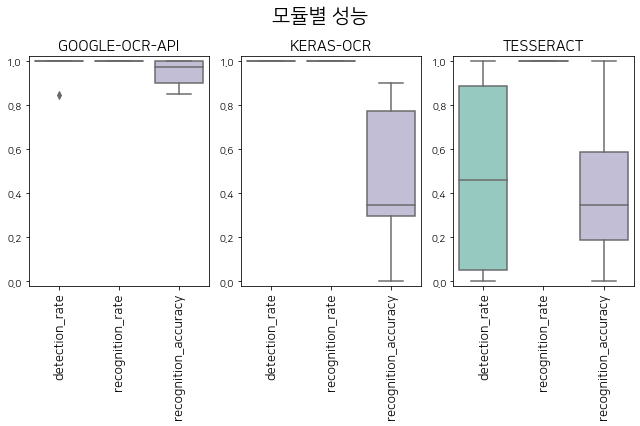

In [237]:
fig, axes = plt.subplots(1, 3, figsize=(9, 6))
for i, module_name in enumerate(module_names):
    sns.boxplot(data=test_result_df[module_name], palette = "Set3", ax=axes[i])
    axes[i].set_title(module_name, fontsize=15)
    axes[i].set_xticklabels(indicator_names, rotation=90,fontsize=13)
    axes[i].set_ylim(-.02, 1.02)
plt.suptitle('모듈별 성능', fontsize=20)
plt.tight_layout()
plt.show()

- Google OCR API는 모든 지표에서 1에 가까운 우수한 성능을 보였다.
- keras-ocr은 detection에서 우수한 성능을 보였지만, recognition의 정확도에서 낮은 성능을 보였다. 다만, 이는 모듈이 학습하지 않은 한국어 데이터를 포함하고 있기 때문이다. 
- Tesseract는 세가지 모듈 중 가장 좋지 못한 성능을 보였다. detection_rate가 0인, detection에 아예 실패한 경우도 있었으며, detection에는 성공하였지만 recognition이 모두 틀린(*recognition_accuracy=0*) 경우도 발생하였다.

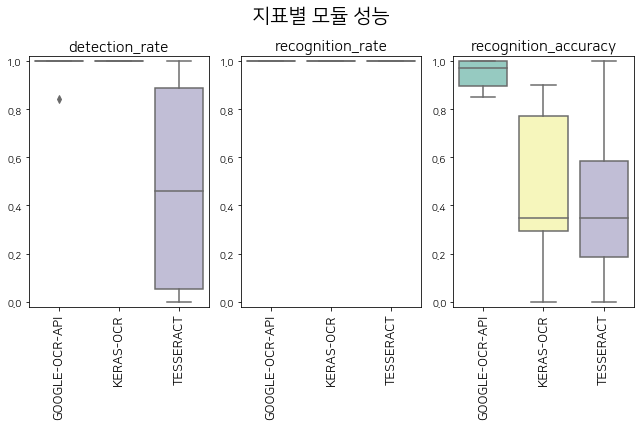

In [263]:
fig, axes = plt.subplots(1, 3, figsize=(9, 6))
for i, indicator_name in enumerate(indicator_names):
    sns.boxplot(data=test_result_df[indicator_name], palette = "Set3", ax=axes[i])
    axes[i].set_title(indicator_name, fontsize=15)
    axes[i].set_xticklabels(module_names, rotation=90,fontsize=13)
    axes[i].set_ylim(-.02, 1.02)
plt.suptitle('지표별 모듈 성능', fontsize=20)
plt.tight_layout()
plt.show()

- Google-OCR-API와 keras-ocr은 detection에서 좋은 성능을 보이고 있다. 반면, Tesseract는 그 범위가 0~1로 detection의 실패 확률이 너무 높아 서비스에 도입하기 어려워보인다.
- 모든 모듈의 recognition_rate이 1로 계산되었다. 이는 일단 recognition을 진행하면, 틀릴지라도 어떠한 결과를 반환한다는 뜻이다.
- recognition_accuracy는 모듈마다 천차만별이었는데, Google-OCR-API이 가장 좋은 성능을 보여주었다. keras-ocr과 Tesseract는 평균이 0.4 이하로, recognition의 결과가 실제 사진에 적힌 글자와 동일한 확률이 절반도 되지 않음을 의미하고 이는 서비스에 사용하기 어렵다는 말과 동일할 것이다.

### 모듈별 지표 평균

keras-ocr의 경우, 모듈의 학습에 한글이 사용되지 않았으므로 한글 데이터에 대해서는 recogition이 제대로 이루어지지 않는다. 이 점을 감안하여 각 모듈의 전체 데이터 지표 평균/영문 데이터 지표 평균/한글 데이터 지표 평균을 구해보았다.

- Google OCR API

In [256]:
test_result_df["GOOGLE-OCR-API"].agg(np.nanmean)

detection_rate          0.973684
recognition_rate        1.000000
recognition_accuracy    0.945588
dtype: float64

In [257]:
# 영문 데이터
test_result_df["GOOGLE-OCR-API"][:3].agg(np.nanmean)

detection_rate          1.00
recognition_rate        1.00
recognition_accuracy    0.95
dtype: float64

In [258]:
# 한글 데이터
test_result_df["GOOGLE-OCR-API"][3:].agg(np.nanmean)

detection_rate          0.947368
recognition_rate        1.000000
recognition_accuracy    0.941176
dtype: float64

한글 데이터가 영문 데이터 보다 낮은 detection_rate와 recognition_accuarcy를 보이고 있다. 그럼도 그 값들이 0.9 이상이므로 성능은 매우 우수한 편이다.

- keras-ocr

In [244]:
test_result_df["KERAS-OCR"].agg(np.nanmean)

detection_rate          1.000000
recognition_rate        1.000000
recognition_accuracy    0.463829
dtype: float64

In [253]:
# 영문 데이터
test_result_df["KERAS-OCR"][:3].agg(np.nanmean)

detection_rate          1.000000
recognition_rate        1.000000
recognition_accuracy    0.731579
dtype: float64

In [259]:
# 한글 데이터
test_result_df["KERAS-OCR"][3:].agg(np.nanmean)

detection_rate          1.000000
recognition_rate        1.000000
recognition_accuracy    0.196078
dtype: float64

한글 데이터라고 명명하였지만, 영양 정보 데이터이기 때문에 숫자와 영문(ex. 100kcal)을 포함하고 있어 한글 데이터의 recognition_accuracy 평균이 0으로 나오지 않았다.  영문 데이터의 경우 평균이 0.73으로 꽤 준수한 성능을 보였다.

- Tesseract

In [262]:
test_result_df["TESSERACT"].agg(np.nanmean)

detection_rate          0.477296
recognition_rate        1.000000
recognition_accuracy    0.423611
dtype: float64

In [260]:
# 영문 데이터
test_result_df["TESSERACT"][:3].agg(np.nanmean)

detection_rate          0.649123
recognition_rate        1.000000
recognition_accuracy    0.722222
dtype: float64

In [261]:
# 한글 데이터
test_result_df["TESSERACT"][3:].agg(np.nanmean)

detection_rate          0.30547
recognition_rate        1.00000
recognition_accuracy    0.12500
dtype: float64

모든 경우에 모든 지표에서 가장 안 좋은 성능을 보이고 있다. recognition_accuracy의 평균값이 keras-ocr와 큰 차이가 없기는 하지만, detection_rate의 평균이 0.5도 안되기 때문에 keras-ocr보도 성능이 아주 않좋은 것으로 볼 수 있다.

### 결론

결론은 내리기전에 대상 서비스에 대해 다시 생각해 보자.

서비스가 동작할 장소는 식단 다이어리 어플리케이션으로 이 어플은 오늘 먹은 식품의 영양정보를 직접 사용자가 입력해야 하는 불편함이 있었다고 가정한다. 이 불편함을 해소하고자 사용자가 제품의 영양 정보의 사진을 찍어 업로드하면 그로부터 식품의 영양 정보를 텍스트로 읽어들이는 서비스를 추가하고 한다.  이 서비스를 위해서는 OCR 기술을 이용하여 사진의 문자들을 인식한 후, 어플에 기입할 영양 정보들은 찾고 그 근처에 위치한 숫자(함유량)을 읽어들여야 한다.<br>이 서비스에서 가장 중요한 것은 "탄수화물", "지방", "Cholesterol"과 같은 정보의 위치와 이름을 정확하게 인식해야 한다는 것이다. 그 위치를 기반으로 숫자정보를 읽기 때문에 위치가 정확해야하고, 인식된 문자들 중 특정 문자들만 어플에 저장하고 특정 문자인지를 판별하는 것은 비교를 통해 이루어지기 때문에 이름을 정확히 인식해야 한다. 즉 이 어플에 사용된 OCR 기술은 당연하게도 detection rate와 recognition accuracy가 높아야 한다.

본 프로젝트에서 살펴본 세가지의 모듈 중 detection rate와 recognition accuracy가 가장 높은 모듈은 **<u>Google-OCR-API</u>** 로 서비스에 사용하기 가장 적합한 모듈이었다.

하지만 이 서비스를 어플리케이션에서 제공한다고 생각하면 Google-OCR-API는 그렇게 좋은 선택지라고 생각되지 않는다. 얕은 지식으로 생각해 보았을 때, Google-OCR-API를 서비스 개발에 사용한다면 다음과 같은 사항들을 고려해 봐야 할것이다.
- 비용문제 : 규칙적으로 어플리케이션을 이용하여 식단을 기입하는 이용자가 100명이라고 가정한다면, 한달에 9000건(100명x3끼x30일)의 요청을 API에 보내야하고 이때 발생하는 비용은 13500달러\($1.50x9000\)로 한화로 약 15,252,100원(2021.03.23. 기준)이다.
 - 오프라인시 사용불가 : API를 사용한다는 것은 인터넷을 통하여 서버에 요청을 보낸다는 것이다. 즉 인터넷 사용이 불가능하다면 해당 서비스의 이용이 제한된다.

그렇다면 위 사항들을 개선할 수 있는 보완책으로는 어떤것이 있을까? 지금 바로 생각하는 것은 keras-ocr을 이용하여 detection을 진행하고 그 결과를 input으로 받아 특정 정보들만을 찾아내는 모델을 새로 만드는 것이다. 테스트 결과로 도출한 keras-ocr의 detection rate는 1로 Google-OCR-API보다 높은 수치를 보였다는 점과 제품의 영양 정보는 어떤 폰트로 쓰여진 출력물이라는 점에서 착안하였다. 새로 만들어야 할 모델은 두 종류를 생각해 볼 수 있었다.

1. 조각난 이미지를 읽어들여 어떤 단어인지 분류(이 때, 클래스는 뽑아내기를 원하는 특정 정보="탄수화물", "지방", ...)하는 분류기 + 이미지를 입력받아 텍스트로 반환하는 인식기
    - 분류기를 통하여 이미지가 찾고하자는 단어가 맞다는 것이 확인되면, 근처에 존재하는 이미지들을 인식기에 넣어 적절한 형태의 가진 텍스트를 찾아낸다.
2. 전체 이미지를 입력 받아 특정 정보를 찾아 반환하는 encoder/decoder 형태의 모델
    - 모델의 출력은 길이가 10인 배열로, 배열을 0번째는 칼로리, 1번째는 탄수화물의 함유량, ... 과 같은 식이 되도록한다.
    - keras-ocr이 필요없어진다.

인터넷 상에 공개된 다양한 폰트를 이용하여 무한한 학습 데이터를 생성할 수 있기 때문에 모델을 새로 만드는 것도 고려해볼만한 시도라고 생각되었다.

## STEP 4. 결론
---

### 프로젝트 평가
1. OCR을 활용하여 구현하려는 서비스의 기획이 타당한가?<br>
    - 사용자가 직접 영양정보를 입력하는 여러 단계의 작업이 사진을 찍는 하나의 활동으로 대체 되기 때문에 충분히 유용한 서비스라고 생각된다.
2. 모델 평가기준이 명확하고 체계적으로 세워졌는가?<br>
    - 모델 평가를 위하여 프로젝트에서 제시한 평가기준은 다음과 같다.
    - detection_rate : 이미지에서 문자의 영역 검출에 성공한 비율
    - recognition_rate : 이미지에서 문자를 인식하여 텍스트로 변환하는데 성공한 비율
    - recognition_accuary : 이미지에서 문자를 인식하여 텍스트로 변화하였을 때, 얻어진 텍스트가 실제로 씌여짐 값과 일치하는지에 대한 비율
    - 나름의 기준을 세웠으나, 아쉬운 점은 detection_accuary를 추가하여 찾아낸 영역이 단어 단위로 깔끔하게 구분지어졌는지를 확인했으면 좋았을 것 같다.
3. 평가기준에 따라 충분한 분량의 테스트가 진행되고 그 결과가 잘 정리되었는가?
    - 총 6장의 이미지를 준비하여 테스트를 진행하였다.
    - 더 많은 양의 테스트 데이터를 사용했으면 좋았겠지만, 위에서 세운 지표들을 계산하는 것이 눈과 손으로 하는 수작업이어서 더 이상 늘릴 수가 없었다.
     - 테스트 결과는 이미지/plot/Data Frame로 잘 정리 되었다.

### 회고
- 테스트 결과에서 지표를 계산하는 과정을 수동으로 한 것이 너무 아쉽다. 시간도 많이 들고 눈과 손이 힘들었다. 슈퍼코딩고수가 되서 모든 테스팅을 자동으로 하게 될 날이 어서오면 좋겠다.

## Code Collection
---

### environment setting
- import packages
- set directory path
- initialization gpu

In [1]:
# import packages ########################################################
import numpy as np
import os
from glob import glob
from matplotlib import pyplot as plt
import tensorflow as tf
import cv2

from google.cloud import vision
import io

import keras_ocr
import pytesseract
from pytesseract import Output

import random

# set directory path# ####a###################################################
workspace_path = os.getenv('HOME')+'/workspace/aiffel-exploration-workspace/E18_OCR'
data_path = workspace_path + '/Nutrition_Facts'
img_path = data_path + '/imgs'
more_img_path = data_path + '/imgs_more'
result_dir_path = data_path + '/recognition_results'
google_result_path = result_dir_path + '/google_ocr_api'
keras_result_path = result_dir_path + '/keras_ocr'
tesseract_result_path = result_dir_path + '/tesseract'

In [2]:
# initialization gpu ########################################################
def init_gpu():
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
        try:
            # Currently, memory growth needs to be the same across GPUs
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
            logical_gpus = tf.config.experimental.list_logical_devices('GPU')
            print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs\n\n")
        except RuntimeError as e:
            # Memory growth must be set before GPUs have been initialized
            print(e, "\n\n")
        
init_gpu()

In [3]:
# set GOOGLE_APPLICATION_CREDENTIALS #####################################
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] =  os.getenv('HOME')+'/workspace/aiffel-exploration-workspace/E18_OCR/my_google_api_key.json'

### Test Modules

#### Annotation
OCR의 결과로 생성된 anntaion을 저장할 공통 클래스.

In [4]:
class Annotation():
    def __init__(self, desc, bounds):
        self.desc = desc
        self.bounds = bounds
        
    def __repr__(self):
        return f'{{ desc:"{self.desc}",\nbounds:{self.bounds} }}'
    
    def __str__(self):
        return f'{{ desc:"{self.desc}",\nbounds:{self.bounds} }}'

#### Report
모듈의 결과를 공통의 클래스 Report에 저장하여 관리한다.

In [5]:
class Report():
    def __init__(self, module, img_path, lang):
        self._annotations = []
        
        if module not in ['GOOGLE-OCR-API', 'KERAS-OCR', 'TESSERACT']:
            raise Exception(f'Invalid module type {module}')
        else:
            self._module = module
        self._img_path = img_path
        self._lang = lang
        self.detection_rate = -1
        self.recognition_rate = -1
        self.recognition_accuracy = -1
    
    def _summary_google(self, result):
        def abstract_bounds(bounding_poly):
            res = []
            for vertex in bounding_poly.vertices:
                v = [0, 0]
                if vertex.x: v[0] = vertex.x
                if vertex.y: v[1] = vertex.y
                res.append(v)
            return res

        annotations = []
        for ta in result.text_annotations:
            bounds = abstract_bounds(ta.bounding_poly)
            annotations.append(Annotation(ta.description, bounds))

        return annotations[1:]
    
    def _summary_keras(self, result):
        return [ Annotation(a[0], a[1].tolist()) for a in result ]
    
    def _summary_tesseract(self, result):
        annotations = []
        top_level = max(result['level'])
        
        for i, text in enumerate(result['text']):
            if result['level'][i] == top_level:
                top, left = result['top'][i], result['left'][i]
                bottom, right = top + result['height'][i], left + result['width'][i]
    #             bounds = [[top, left], [top, right], [bottom, right], [bottom, left]]
                bounds = [[left, top], [right, top], [right, bottom], [left, bottom]]
                annotations.append(Annotation(result['text'][i], bounds))
        return annotations
    
    def summary(self, result):
        if self._module == 'GOOGLE-OCR-API':
            self._annotations = self._summary_google(result)
        elif self._module == 'KERAS-OCR':
            self._annotations = self._summary_keras(result)
        elif self._module == 'TESSERACT':
            self._annotations = self._summary_tesseract(result)
    
    def get_img_with_bounds(self, thickness=1):
        def get_random_color():
            return (random.randint(0, 256), random.randint(0, 256), random.randint(0, 256))

        img = cv2.imread(self._img_path)

        for cur in self._annotations:
            pts = np.array(cur.bounds, dtype=np.int32)
            color = get_random_color()
            cv2.polylines(img, [pts], True, color, thickness=thickness)
        
        return img
    
    def _get_croped_img(self, img, bounds):
        bounds = np.array(bounds, dtype=np.int32)
        
        # (1) crop the bounding rect
        pts = np.array(bounds)
        x, y, w, h = cv2.boundingRect(pts)
        croped = img[y:y+h, x:x+w].copy()
        
        # (2) make mask
        pts = pts - pts.min(axis=0)
        mask = np.zeros(croped.shape[:2], np.uint8)
        cv2.drawContours(mask, [pts], -1, (255, 255, 255), -1, cv2.LINE_AA)

        ## (3) do bit-op
        dst = cv2.bitwise_and(croped, croped, mask=mask)

        return dst
    
    def get_recognition_results(self, figsize, save=False, show=True):
        img = cv2.imread(self._img_path)
        fig, axes = plt.subplots(len(self._annotations), 1, squeeze=True, figsize=figsize)
        
        for i, annotation in enumerate(self._annotations):
            croped_img = self._get_croped_img(img, annotation.bounds)
            
            axes[i].imshow(croped_img)
            axes[i].text(1.1, 1, annotation.desc, transform=axes[i].transAxes,
                    verticalalignment='top', fontsize=12)
            axes[i].text(-0.1, 1, f'index : {i}', transform=axes[i].transAxes,
                    verticalalignment='top', horizontalalignment='right', fontsize=12)
            axes[i].get_xaxis().set_visible(False)
            axes[i].get_yaxis().set_visible(False)
            axes[i].set_anchor('W')
        
        plt.tight_layout()
        
        if save:
            save_path = self._img_path.split('/')[-1].split('.')[0]
            if self._module == 'GOOGLE-OCR-API':
                save_path = google_result_path + '/' + save_path + '.png'
            elif self._module == 'KERAS-OCR':
                save_path = keras_result_path + '/' + save_path + '.png'
            elif self._module == 'TESSERACT':
                save_path = tesseract_result_path + '/' + save_path + '.png'
            plt.savefig(save_path, facecolor='#ffffff')
            print(f'save {save_path}')
        
        if not show: plt.close()
        plt.show()
        
    def set_detection_rate(self, detection_rate):
        self.detection_rate = detection_rate
        
    def set_recognition_rate(self, recognition_rate):
        self.recognition_rate = recognition_rate
        
    def set_recognition_accuracy(self, recognition_accuracy):
        self.recognition_accuracy = recognition_accuracy
    
    def __str__(self):
        return (
            f'{{\nimg_path: {self._img_path},\n'
            f'module: {self._module},\n'
            f'detection_rate: {self.detection_rate},\n'
            f'recognition_rate: {self.recognition_rate},\n'
            f'recognition_accuracy: {self.recognition_accuracy}}}'
        )

#### test_google

In [6]:
def test_google(path):
    client = vision.ImageAnnotatorClient()

    # load image
    with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
    image = vision.Image(content=content)
    
    response = client.text_detection(image=image)

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))
        
    return response

#### test_keras_ocr

In [7]:
def test_keras_ocr(path, pipeline):
    return pipeline.recognize([path])[0]

#### test_tesseract

In [8]:
def test_tesseract(path, lang):
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = cv2.imread(path)
    
    recognized_data = pytesseract.image_to_data(
        image, lang=lang,    # eng, kor, eng+kor
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    return recognized_data

### Printing

#### show image

In [9]:
def show_images(img_paths, titles, figsize, col_num=1):
    if col_num != len(img_paths):
        raise Exception(f'col_num must be same with len(img_paths)')
    
    fig, axes = plt.subplots(1, col_num, figsize=figsize)
    
    for i, ax in enumerate(axes):
        img = cv2.imread(img_paths[i])
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(titles[i])
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    
    plt.tight_layout()
    plt.show()

In [10]:
def show_image(img_path, title, figsize):
    fig = plt.figure(figsize=figsize)
    img = cv2.imread(img_path)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

## ref
---
- [keras-ocr](https://keras-ocr.readthedocs.io/en/latest/)
- [google.cloud.vision_v1.types.image_annotator.AnnotateImageResponse](https://cloud.google.com/vision/docs/reference/rest/v1/AnnotateImageResponse)
- [OpenCV - 4. 도형 그리기](https://bkshin.tistory.com/entry/OpenCV-4-%EB%8F%84%ED%98%95-%EA%B7%B8%EB%A6%AC%EA%B8%B0)
- [Python 출력 text의 color를 변경해 보자](https://sosomemo.tistory.com/59)
- [Cropping Concave polygon from Image using Opencv python](https://stackoverflow.com/questions/48301186/cropping-concave-polygon-from-image-using-opencv-python)